In [12]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [13]:

calendar_path = os.path.join(os.getcwd(), 'data', 'calendar.csv')
trainDF_path = os.path.join(os.getcwd(), 'data', 'sales_train_validation.csv')
pricesDF_path = os.path.join(os.getcwd(), 'data', 'sell_prices.csv')

df = pd.read_csv(trainDF_path)
calendarDF = pd.read_csv(calendar_path)

In [14]:
df = df[(df['store_id']=='CA_3') & (df['dept_id']=='FOODS_3')]

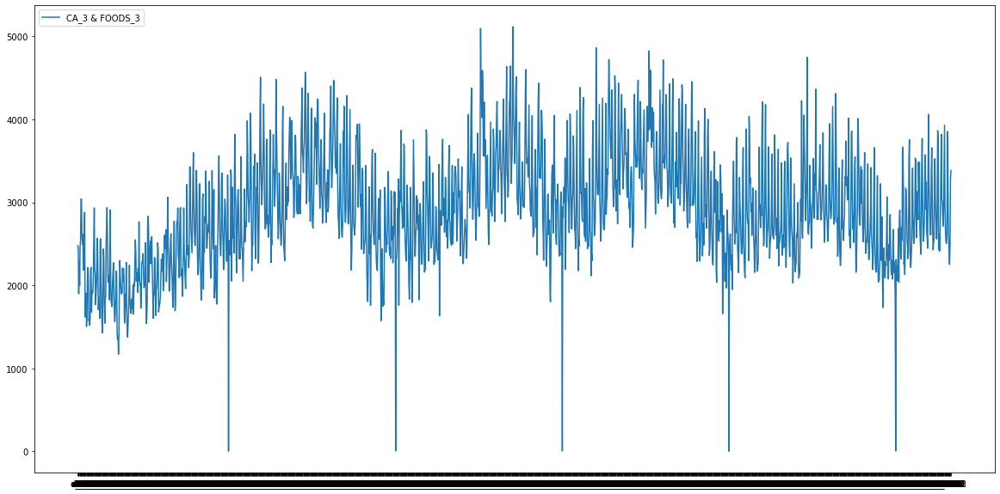

In [15]:
chartData = df.iloc[:,6:].sum()
labels = ['CA_3 & FOODS_3']

plt.figure(figsize=(20,10))
plt.plot(chartData)
plt.legend(labels, loc='upper left')
plt.show()

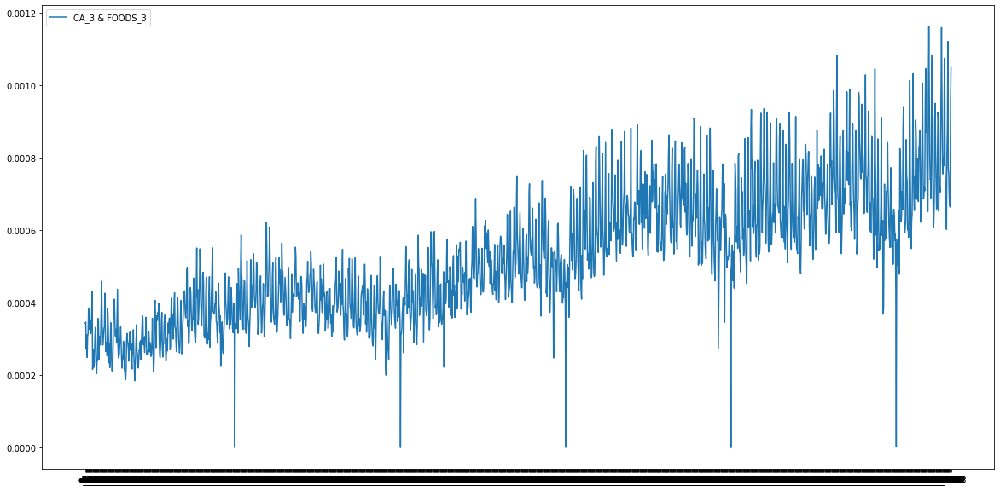

In [16]:
dfNorm = df.iloc[:,6:].div(df.sum(axis=1), axis=0)

# chartData = dfNorm.sum()
# chartData = dfNorm.median()
chartData = dfNorm.mean()
labels = ['CA_3 & FOODS_3']

plt.figure(figsize=(20,10))
plt.plot(chartData)
plt.legend(labels, loc='upper left')
plt.show()

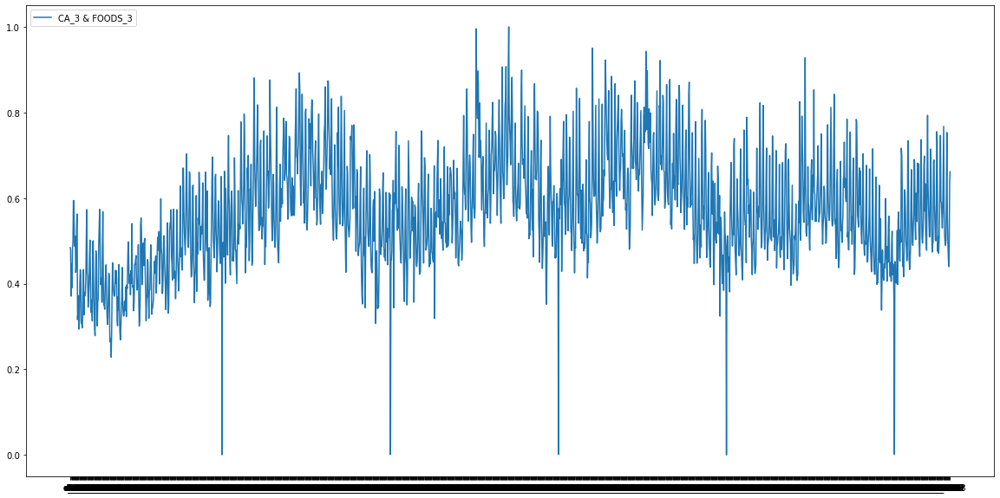

In [17]:
dfSum = df.iloc[:,6:].sum()
dfSumNorm = ((dfSum-dfSum.min())/(dfSum.max()-dfSum.min()))

labels = ['CA_3 & FOODS_3']

plt.figure(figsize=(20,10))
plt.plot(dfSumNorm)
plt.legend(labels, loc='upper left')
plt.show()

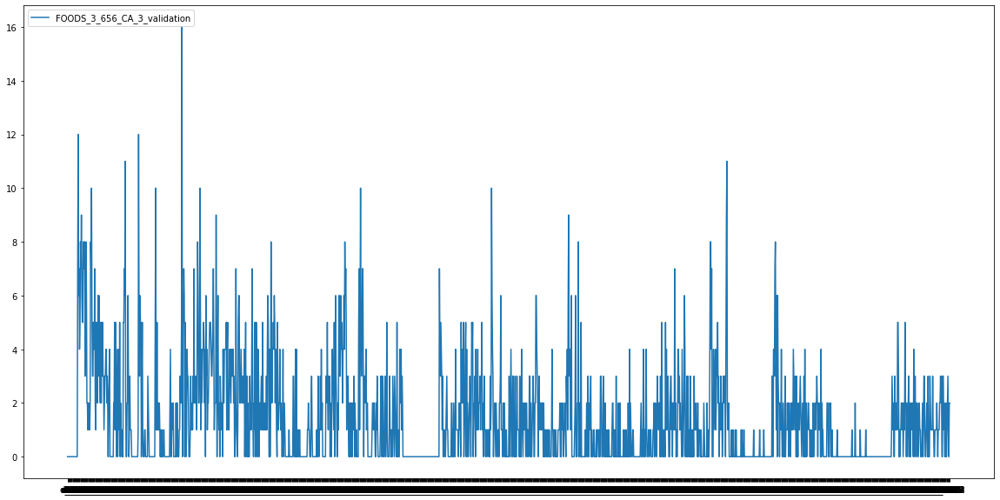

In [18]:
itemNum = 654


chartData = df.iloc[itemNum,6:]
labels = [df.iloc[itemNum,0]]

plt.figure(figsize=(20,10))
plt.plot(chartData)
plt.legend(labels, loc='upper left')
plt.show()

In [19]:
df

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
8324,FOODS_3_001_CA_3_validation,FOODS_3_001,FOODS_3,FOODS,CA_3,CA,4,1,1,0,...,2,0,6,2,0,3,4,0,0,2
8325,FOODS_3_002_CA_3_validation,FOODS_3_002,FOODS_3,FOODS,CA_3,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8326,FOODS_3_003_CA_3_validation,FOODS_3_003,FOODS_3,FOODS,CA_3,CA,0,0,0,0,...,1,1,3,1,2,0,0,1,1,3
8327,FOODS_3_004_CA_3_validation,FOODS_3_004,FOODS_3,FOODS,CA_3,CA,0,0,0,0,...,2,0,2,0,0,0,0,0,0,1
8328,FOODS_3_005_CA_3_validation,FOODS_3_005,FOODS_3,FOODS,CA_3,CA,1,3,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9142,FOODS_3_823_CA_3_validation,FOODS_3_823,FOODS_3,FOODS,CA_3,CA,10,5,4,5,...,2,2,2,3,3,2,3,4,1,0
9143,FOODS_3_824_CA_3_validation,FOODS_3_824,FOODS_3,FOODS,CA_3,CA,1,3,1,2,...,0,3,1,0,1,0,4,1,0,1
9144,FOODS_3_825_CA_3_validation,FOODS_3_825,FOODS_3,FOODS,CA_3,CA,0,0,0,0,...,3,0,4,3,3,0,0,3,3,6
9145,FOODS_3_826_CA_3_validation,FOODS_3_826,FOODS_3,FOODS,CA_3,CA,0,0,0,0,...,5,2,2,0,1,1,3,0,1,3


(0.07041168980027757, 0.002059823253176878)


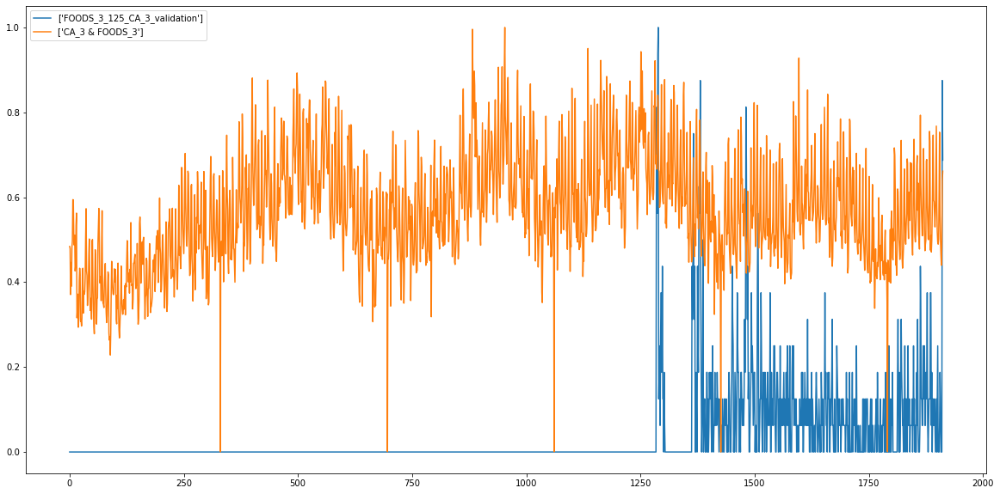

In [20]:
from scipy.stats.stats import pearsonr

itemNum = 123
sales1 = df.iloc[itemNum,6:]

# dfNorm = df.iloc[:,6:].div(df.sum(axis=1), axis=0)

# sales2 = dfNorm.sum()
# sales2 = dfNorm.mean()
sales2 = df.iloc[:,6:].sum()
sales2 = (sales2-sales2.min())/(sales2.max()-sales2.min())

sales1 = np.array((sales1-sales1.min())/(sales1.max()-sales1.min()))
sales2 = np.array(sales2)
print(pearsonr(sales1, sales2))

#--------------------------------

# chartData = df.iloc[itemNum,6:]
label1 = [df.iloc[itemNum,0]]
label2 = ['CA_3 & FOODS_3']

plt.figure(figsize=(20,10))
plt.plot(sales1, label = label1)
plt.plot(sales2, label = label2)
plt.legend(loc='upper left')
plt.show()


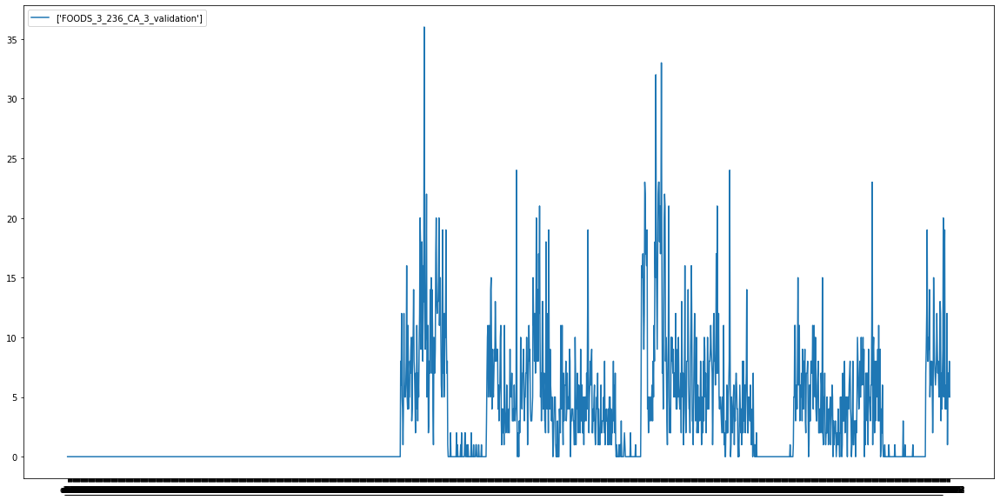

In [21]:
itemNum = 234
sales1 = df.iloc[itemNum,6:]
# sales1 = df.iloc[itemNum,1250:]

label1 = [df.iloc[itemNum,0]]

plt.figure(figsize=(20,10))
plt.plot(sales1, label = label1)
plt.legend(loc='upper left')
plt.show()

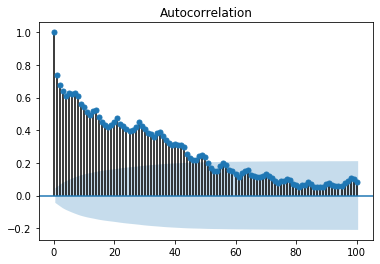

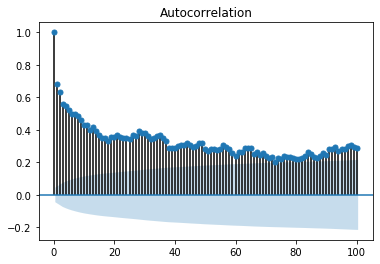

In [22]:
import statsmodels.api as sm

itemNum = 234
sm.graphics.tsa.plot_acf(df.iloc[itemNum,6:], lags=100)
plt.show()

itemNum = 432
sm.graphics.tsa.plot_acf(df.iloc[itemNum,6:], lags=100)
plt.show()

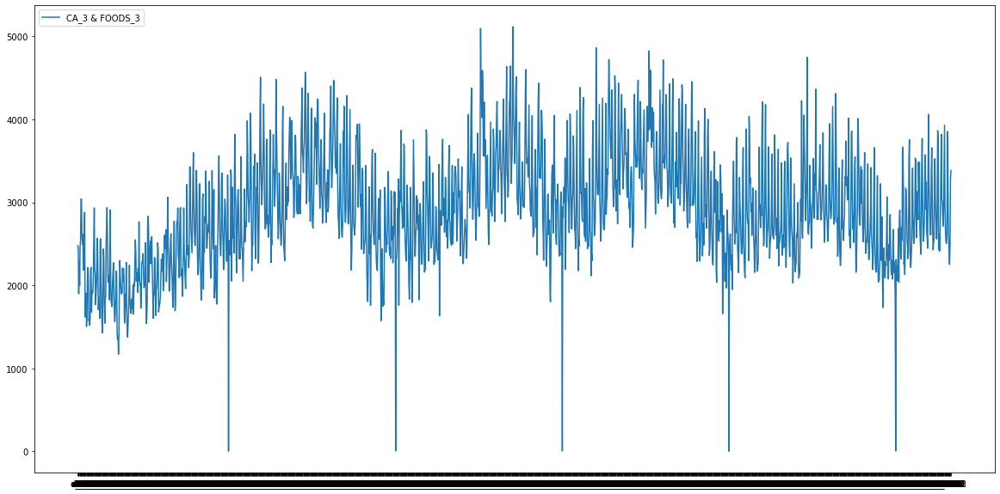

In [23]:
chartData = df.iloc[:,6:].sum()
labels = ['CA_3 & FOODS_3']

plt.figure(figsize=(20,10))
plt.plot(chartData)
plt.legend(labels, loc='upper left')
plt.show()

[0.51836864]
[[5.42320606e-05]]


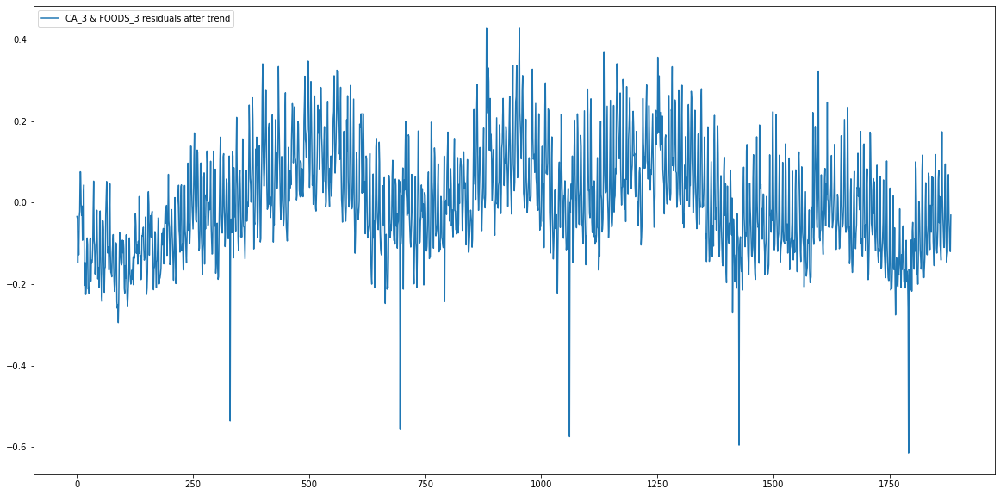

In [79]:
# using d_1 -> d_1883 for training
# d_1884 -> d1913 for validation

trainDF = df.iloc[:,6:1889].sum()
validationDF = df.iloc[:,1889:].sum()

# normalize
yTrain = np.array((trainDF-trainDF.min())/(trainDF.max()-trainDF.min())).reshape(-1, 1)
xTrain = np.arange(0,len(xTrain)).reshape(-1, 1)


# modeling trend
from sklearn.linear_model import LinearRegression
from sklearn import metrics

regressor = LinearRegression()  
regressor.fit(xTrain, yTrain)
print(regressor.intercept_)
print(regressor.coef_)

trendResid = yTrain - (regressor.coef_ * xTrain + regressor.intercept_)

labels = ['CA_3 & FOODS_3 residuals after trend']

plt.figure(figsize=(20,10))
plt.plot(xTrain, trendResid)
plt.legend(labels, loc='upper left')
plt.show()



In [90]:
from sklearn.preprocessing import OneHotEncoder

calendarDF.loc[:1883,'event_name_1']

0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
          ...    
1879          NaN
1880          NaN
1881    Purim End
1882          NaN
1883          NaN
Name: event_name_1, Length: 1884, dtype: object

In [117]:
# calendarDF.event_name_1.unique()

# trainDF
from sklearn.preprocessing import OneHotEncoder

enc = OneHotEncoder(handle_unknown='ignore')
enc.fit(np.array(calendarDF.loc[:1882,'event_name_1'].fillna(0)).reshape(1, -1))
# calendarDF.loc[:1882,'event_name_1']

OneHotEncoder(categories='auto', drop=None, dtype=<class 'numpy.float64'>,
              handle_unknown='ignore', sparse=True)

In [129]:
# np.array(calendarDF.loc[:1882,'event_name_1'].fillna(0)).reshape(1, -1)

# pd.DataFrame(enc.fit_transform(np.array(calendarDF.loc[:1882,'event_name_1'].fillna(0)).reshape(1, -1)).toarray())
# np.array(calendarDF.loc[:1882,'event_name_1'].fillna(0)).reshape(1, -1)

pd.get_dummies(calendarDF.loc[:1882,['event_name_1','event_name_2']].fillna(0))

,event_name_1_0,event_name_1_Chanukah End,event_name_1_Christmas,event_name_1_Cinco De Mayo,event_name_1_ColumbusDay,event_name_1_Easter,event_name_1_Eid al-Fitr,event_name_1_EidAlAdha,event_name_1_Father's day,event_name_1_Halloween,...,event_name_1_StPatricksDay,event_name_1_SuperBowl,event_name_1_Thanksgiving,event_name_1_ValentinesDay,event_name_1_VeteransDay,event_name_2_0,event_name_2_Cinco De Mayo,event_name_2_Easter,event_name_2_Father's day,event_name_2_OrthodoxEaster
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1878,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1879,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1880,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1881,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [128]:
np.array(calendarDF.loc[:1882,'event_name_1'].fillna(0)).reshape(1, -1)

array([[0, 0, 0, ..., 0, 'Purim End', 0]], dtype=object)